In [1]:
import sys
sys.path.append('..')
from scipy import stats
import numpy as np
import pandas as pd
import random
import seaborn as sns
import matplotlib.pyplot as plt
from nestedness_calculator import NestednessCalculator
import vis_function as vf
import warnings
import scipy.stats
import os
from copy import deepcopy as dc
import matplotlib.pyplot as plt
import json


warnings.filterwarnings('ignore')

def nestedness(fr_df, label):
    unique_fr = []
    for i in range(fr_df.shape[0]):
        for j in range(i+1, fr_df.shape[0]):
            if fr_df.iloc[i, j] > 0:
                unique_fr.append(fr_df.iloc[i,j])
    if len(unique_fr) > 2:
        p_value = scipy.stats.normaltest(unique_fr)[1]
        #print("p_value is {}, normal {}".format(p_value, p_value>0.05))
    xtitle = 'distribution of lCFR ({})'.format(label)
    vf.fr_frequency(fr_df.values, xtitle)
    miu = np.mean(unique_fr)
    sigma = np.std(unique_fr)
    vf.heatmap_fr_continue(fr_df, 'lCFR matrix ({})'.format(label))
    binary_df = vf.heatmap_fr_binary(fr_df, 'binary matrix ({})'.format(label), 0.6)
    nested_nodf_score = NestednessCalculator(binary_df.values).nodf(binary_df.values)
    print("{} NODF = {}".format(label, nested_nodf_score))

    # NULL model 100 times
    a=stats.norm.rvs(miu,sigma,size=len(unique_fr))
    scores = []
    for i in range(100):
        pos_list=random.sample(list(range(0, int((fr_df.shape[0]**2-fr_df.shape[0])/2))), len(unique_fr))
        pos_list.sort()
        empty = np.zeros(shape = fr_df.shape)
        pos_idx = 0
        idx = 0
        for i in range(empty.shape[0]):
            if pos_idx == len(pos_list):
                break
            for j in range(i+1, empty.shape[0]):
                if pos_idx == len(pos_list):
                    break
                elif idx == pos_list[pos_idx]:
                    empty[i][j] = a[pos_idx]
                    pos_idx += 1
                idx += 1 
        empty += empty.T
        row, col = np.diag_indices_from(empty)
        empty[row, col] = 1
        empty_df = pd.DataFrame(empty)
        binary_empty = vf.cutoff_matrix(empty_df, 0.6)
        nodf_score = NestednessCalculator(binary_empty.values).nodf(binary_empty.values)
        scores.append(nodf_score)

    # visualize the last null model
    vf.heatmap_fr_continue(empty_df, 'null model ({})'.format(label))
    vf.heatmap_fr_binary(empty_df, 'null model binary ({})'.format(label), 0.6)
    print("{} last null model NODF = {}".format(label, nodf_score))
    t, p = scipy.stats.ttest_1samp(scores, nested_nodf_score)
    print("{} p value = {}".format(label, p))
    return scores, nested_nodf_score, p

In [2]:
input_dir = '../result/pheno_result'
fr_dict = {}
for disease in os.listdir(input_dir):
    fr_dict[disease] = {}
    disease_dir = os.path.join(input_dir, disease)
    for cohort in os.listdir(disease_dir):
        fr_dict[disease][cohort] = {}
        cdir = os.path.join(disease_dir, cohort, 'sp')
        for pheno in os.listdir(cdir):
            fr = pd.read_csv(os.path.join(cdir, pheno, 'layer_0', 'fr.tsv'), sep='\t', header=0, index_col=0)
            pheno = pheno.split('_')[-1]
            # result\pheno_result\Adenoma\Adenoma1\sp\cluster_Adenoma\layer_0\fr.tsv
            fr_dict[disease][cohort][pheno] = dc(fr)
            

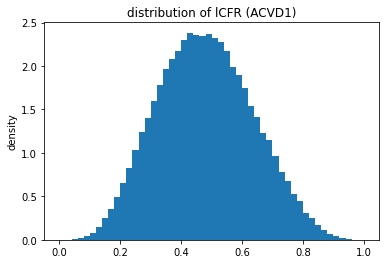

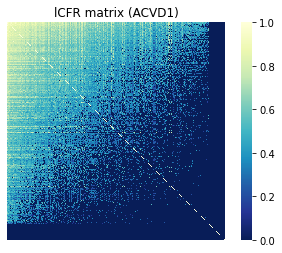

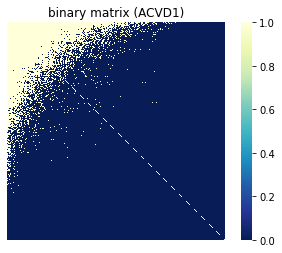

ACVD1 NODF = 0.4394791907327569


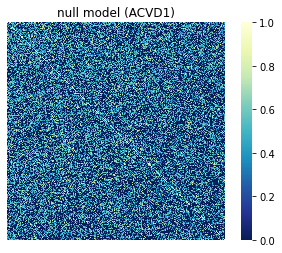

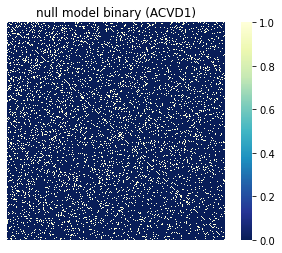

ACVD1 last null model NODF = 0.11423309120249031
ACVD1 p value = 1.45252117353836e-296


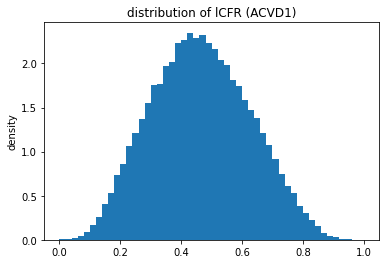

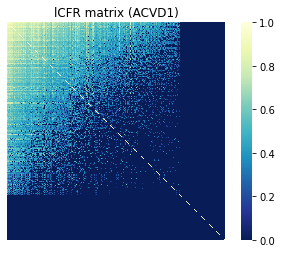

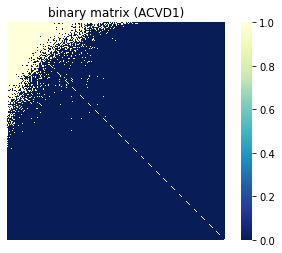

ACVD1 NODF = 0.25822184310127366


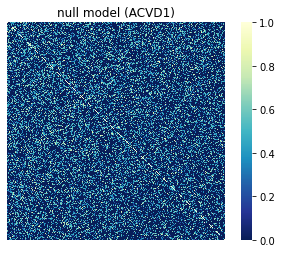

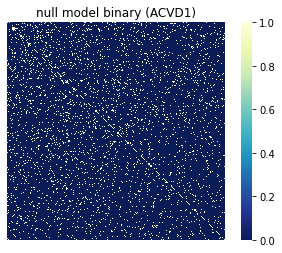

ACVD1 last null model NODF = 0.07178774651598284
ACVD1 p value = 1.3257577905775464e-277


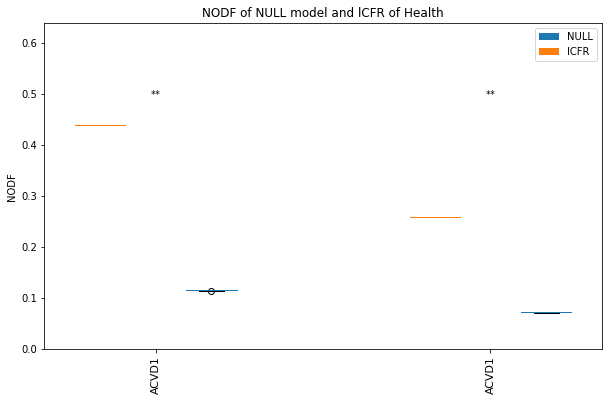

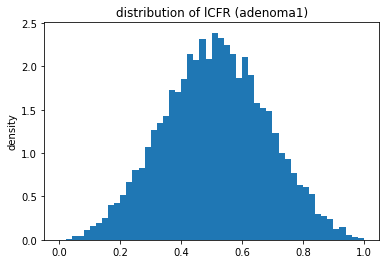

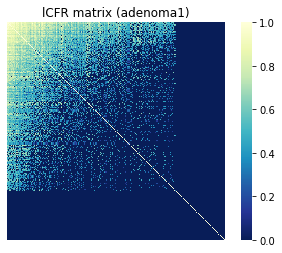

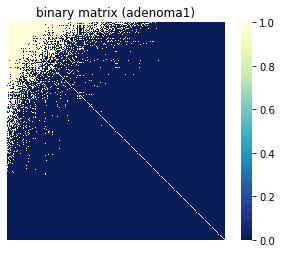

adenoma1 NODF = 0.2856989618616958


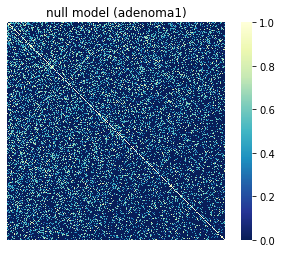

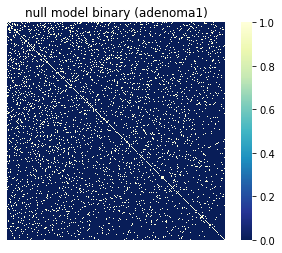

adenoma1 last null model NODF = 0.08643773184062964
adenoma1 p value = 7.515235196148523e-238


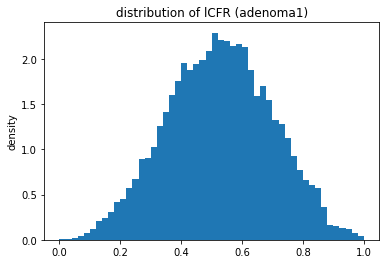

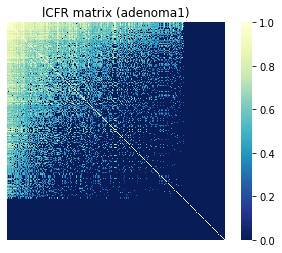

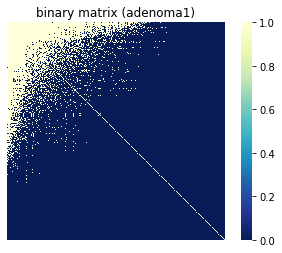

adenoma1 NODF = 0.3500712840830968


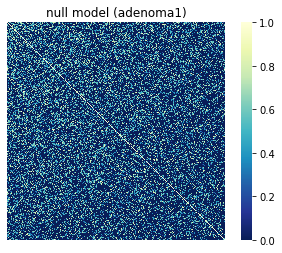

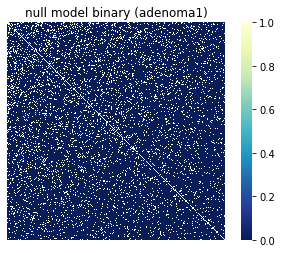

adenoma1 last null model NODF = 0.11852768832495596
adenoma1 p value = 1.4789730726444212e-231


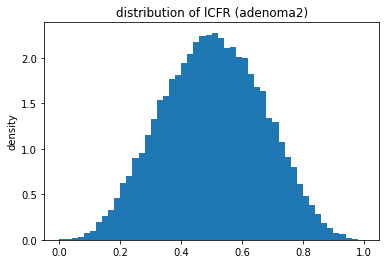

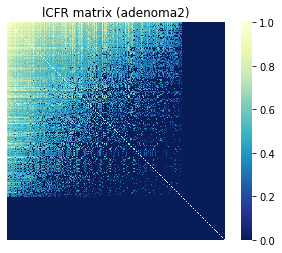

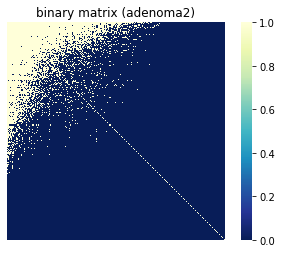

adenoma2 NODF = 0.3653143376609613


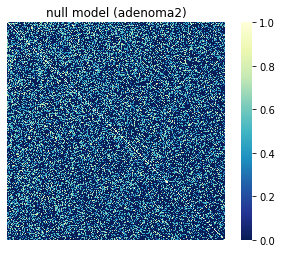

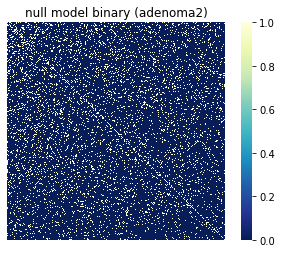

adenoma2 last null model NODF = 0.11599964376906824
adenoma2 p value = 7.762488553678289e-278


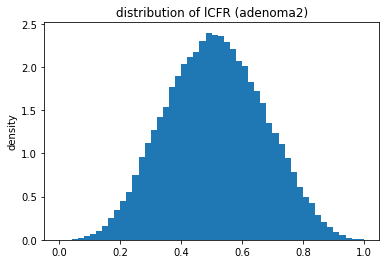

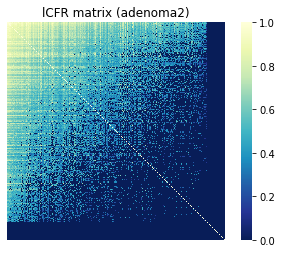

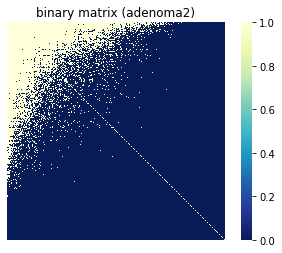

adenoma2 NODF = 0.495520388596846


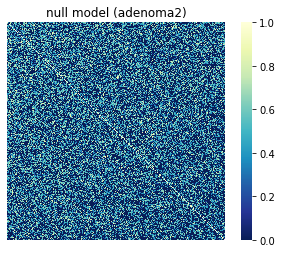

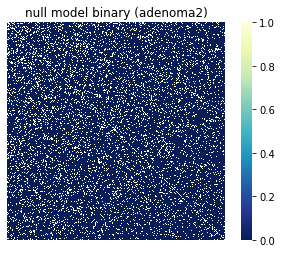

adenoma2 last null model NODF = 0.14529261030600982
adenoma2 p value = 1.3762780573146365e-290


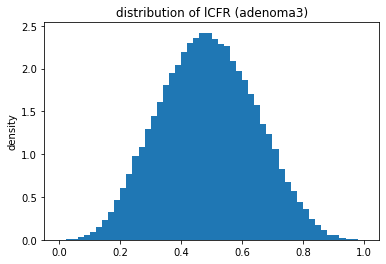

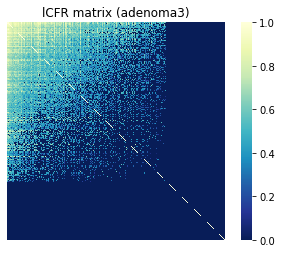

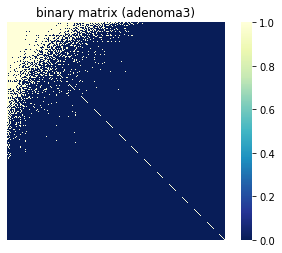

adenoma3 NODF = 0.26664607354939246


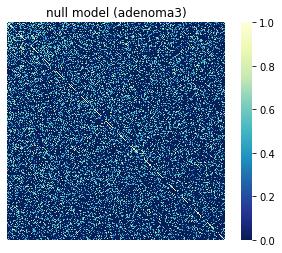

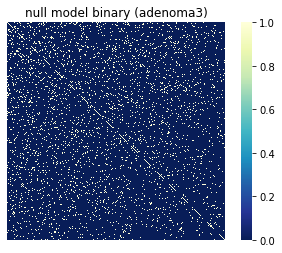

adenoma3 last null model NODF = 0.07431661429699642
adenoma3 p value = 2.3590942993341218e-268


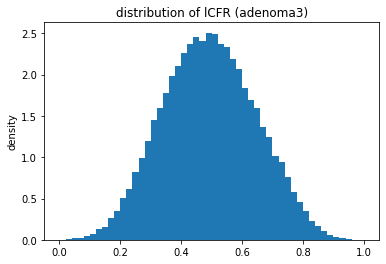

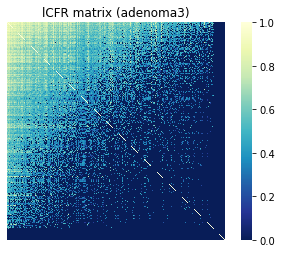

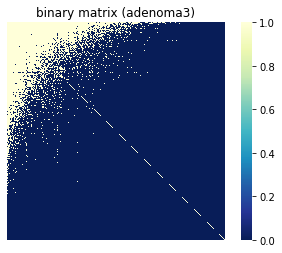

adenoma3 NODF = 0.4254695693098973


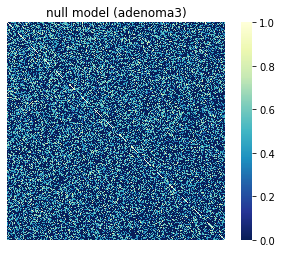

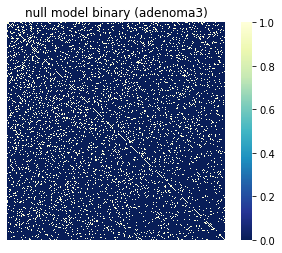

adenoma3 last null model NODF = 0.10932731429457124
adenoma3 p value = 6.967447703924436e-294


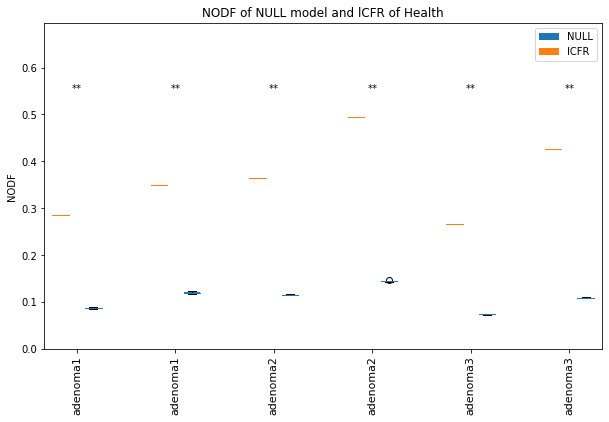

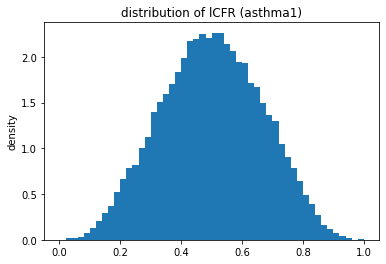

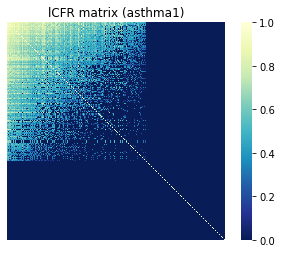

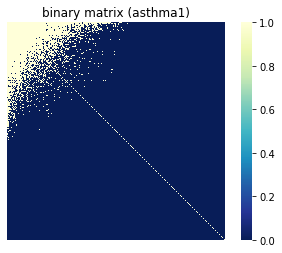

asthma1 NODF = 0.22499585146152035


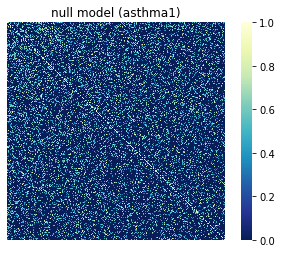

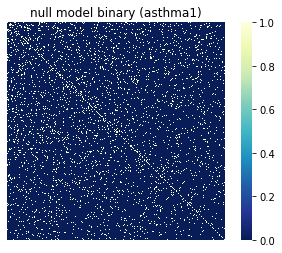

asthma1 last null model NODF = 0.0722479903016783
asthma1 p value = 1.122681849370223e-257


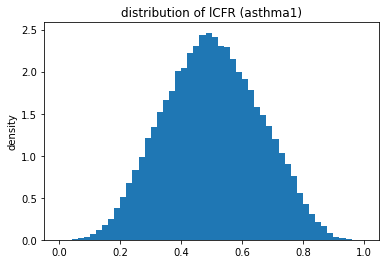

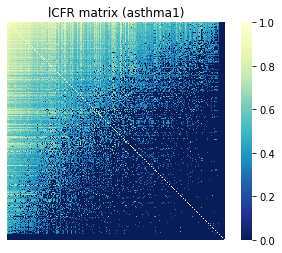

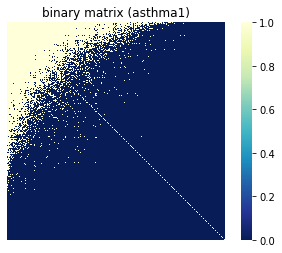

asthma1 NODF = 0.4964679054365476


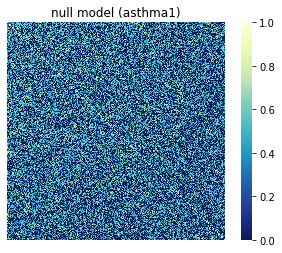

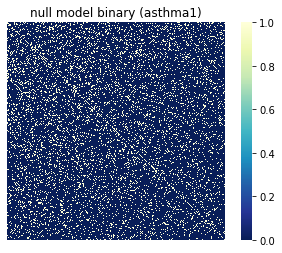

asthma1 last null model NODF = 0.14206304802573164
asthma1 p value = 1.2084553155338436e-286


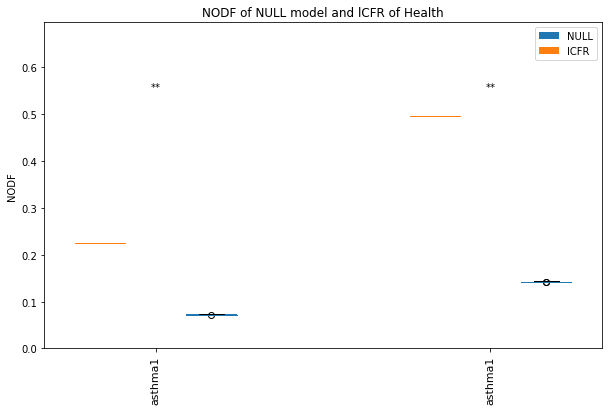

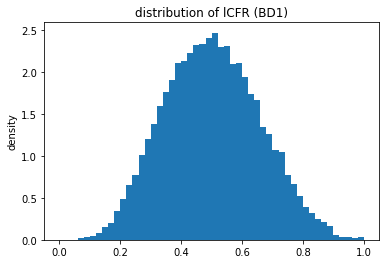

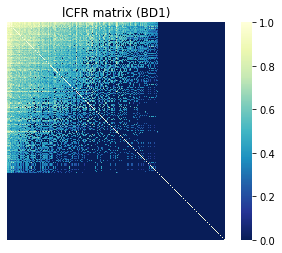

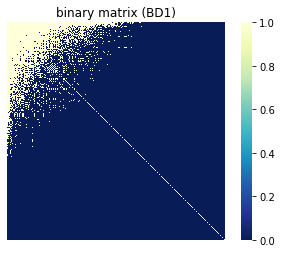

BD1 NODF = 0.2617550749910545


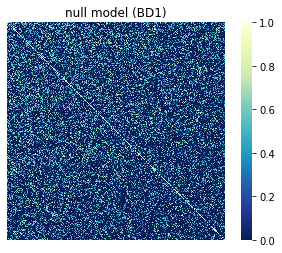

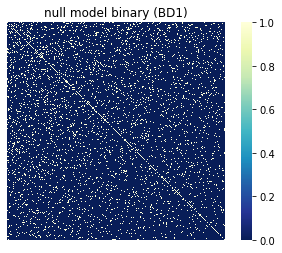

BD1 last null model NODF = 0.08492308469905936
BD1 p value = 1.7143297151283983e-235


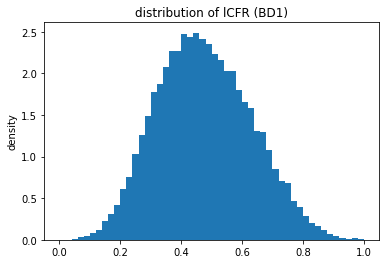

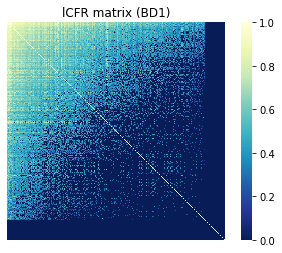

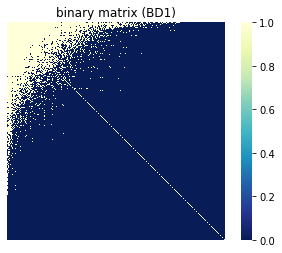

BD1 NODF = 0.4043770432652222


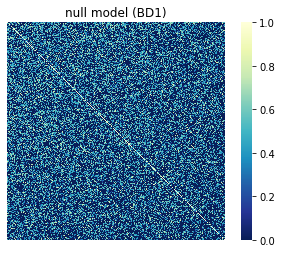

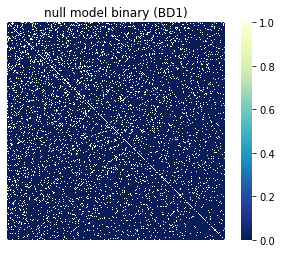

BD1 last null model NODF = 0.10123612377431308
BD1 p value = 5.1143222274343235e-263


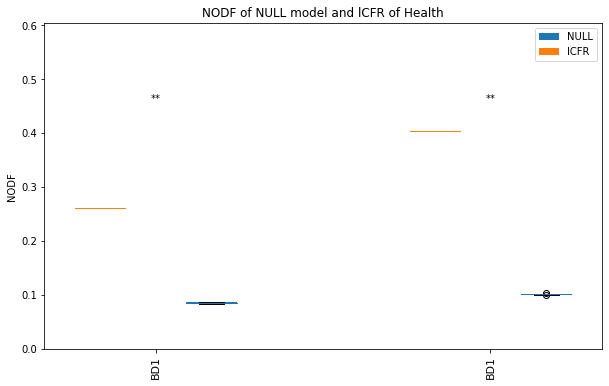

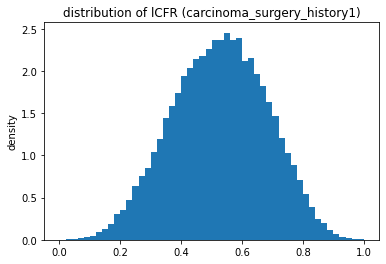

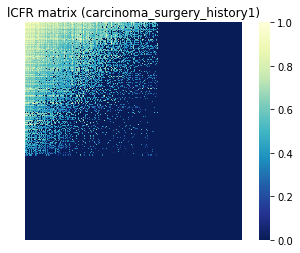

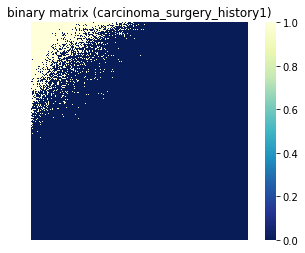

carcinoma_surgery_history1 NODF = 0.19562717834267832


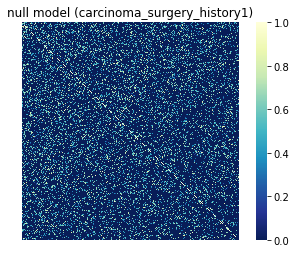

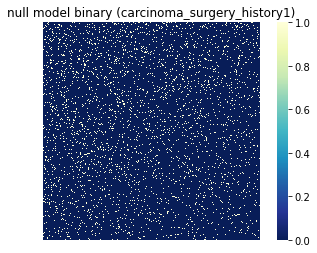

carcinoma_surgery_history1 last null model NODF = 0.06576343777428965
carcinoma_surgery_history1 p value = 1.0106937204742629e-257


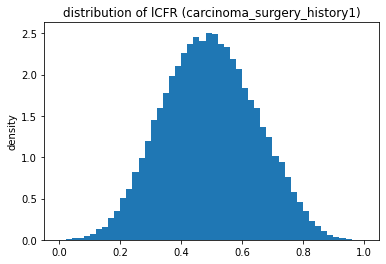

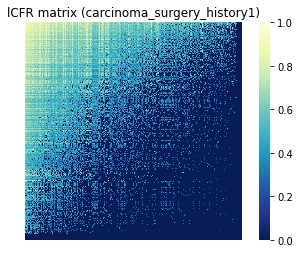

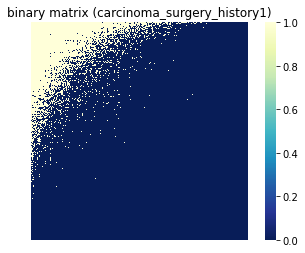

carcinoma_surgery_history1 NODF = 0.4477672880584917


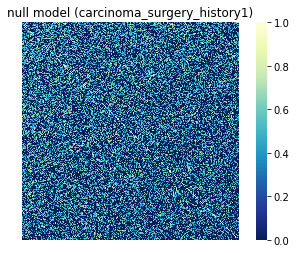

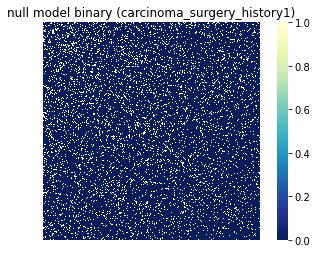

carcinoma_surgery_history1 last null model NODF = 0.11419258179343252
carcinoma_surgery_history1 p value = 8.638659527541734e-295


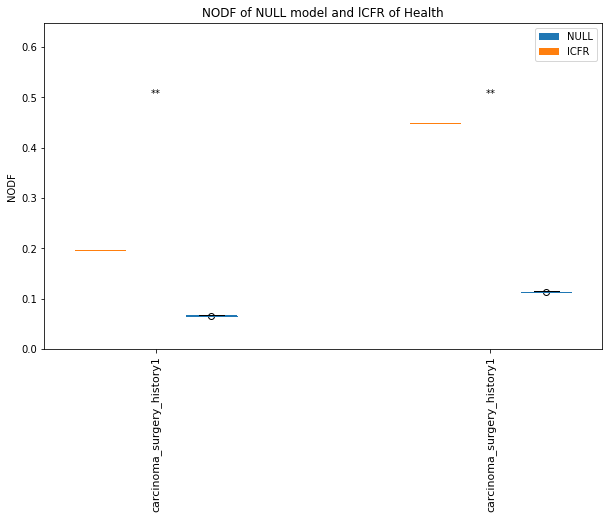

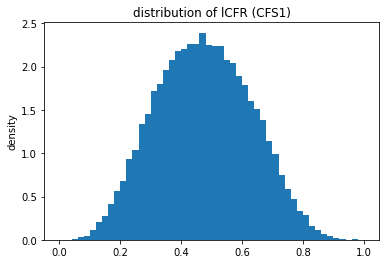

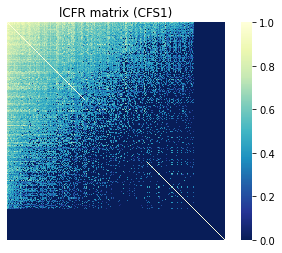

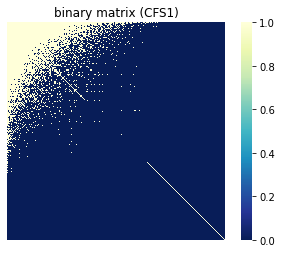

CFS1 NODF = 0.3359241733614088


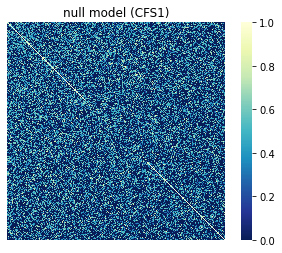

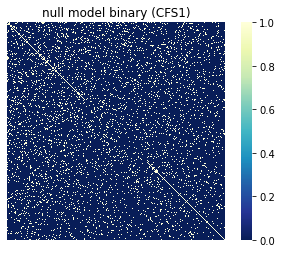

CFS1 last null model NODF = 0.09749178821948729
CFS1 p value = 5.525129076549532e-266


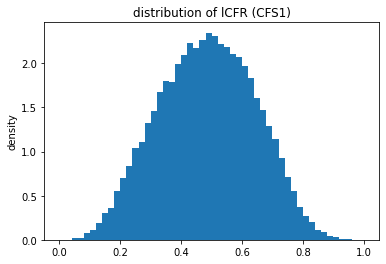

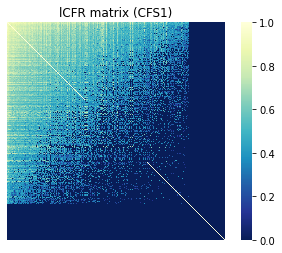

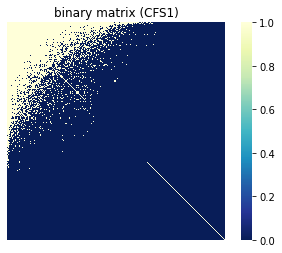

CFS1 NODF = 0.3587243998960109


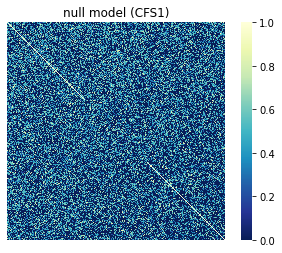

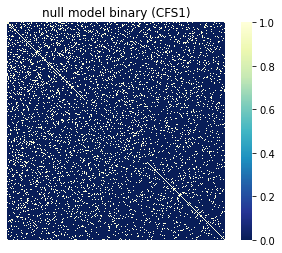

CFS1 last null model NODF = 0.11314858171943015
CFS1 p value = 2.1720311547526205e-263


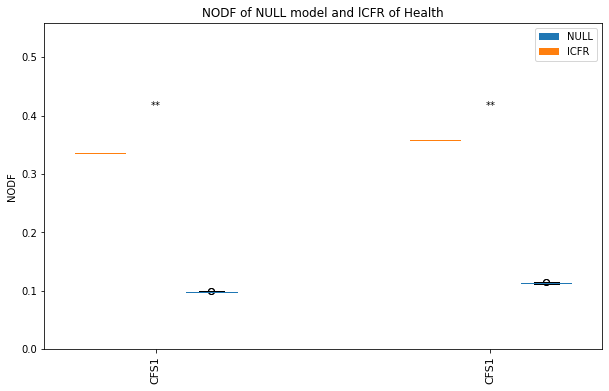

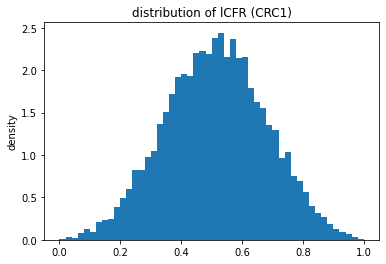

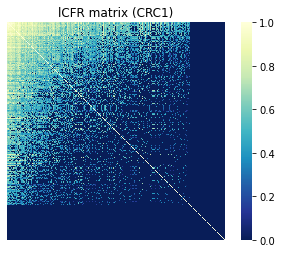

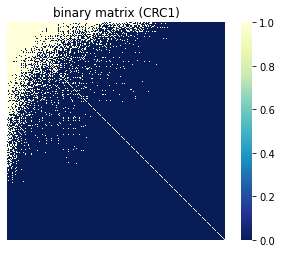

CRC1 NODF = 0.3274767078455598


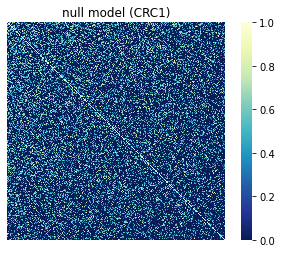

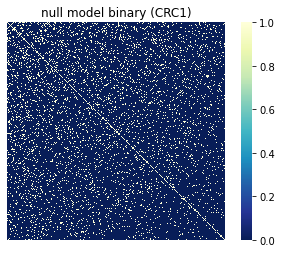

CRC1 last null model NODF = 0.10324250795230265
CRC1 p value = 3.7480278092822317e-240


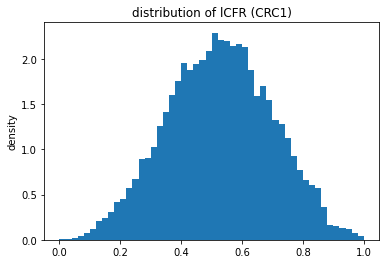

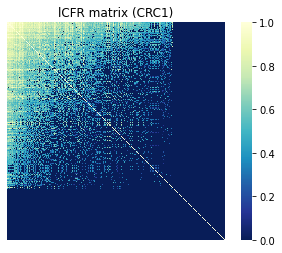

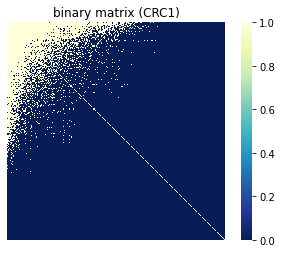

CRC1 NODF = 0.3086963597285741


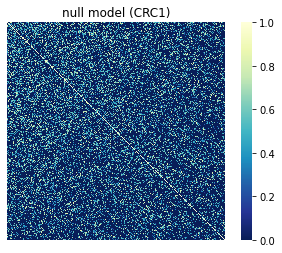

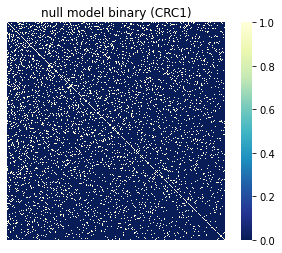

CRC1 last null model NODF = 0.10627077978653636
CRC1 p value = 1.3755162617447442e-225


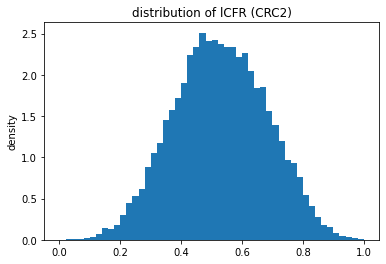

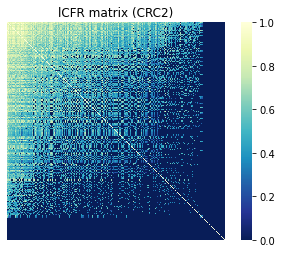

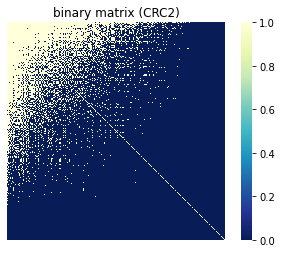

CRC2 NODF = 0.41799435534075063


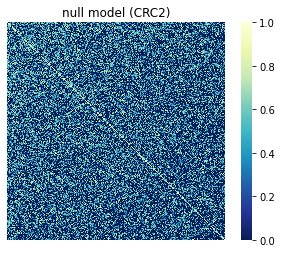

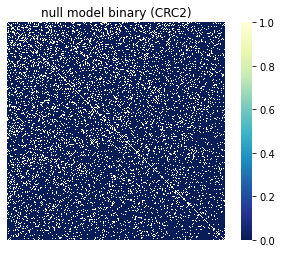

CRC2 last null model NODF = 0.15210075924318933
CRC2 p value = 6.278465855195823e-246


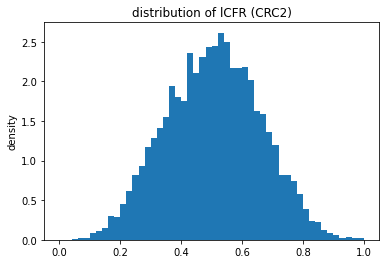

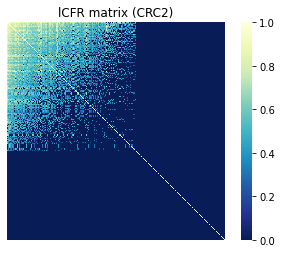

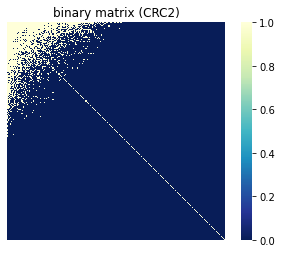

CRC2 NODF = 0.17200965619191577


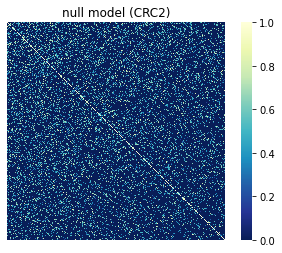

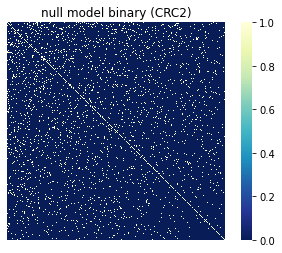

CRC2 last null model NODF = 0.05749861724461908
CRC2 p value = 1.429498463508045e-223


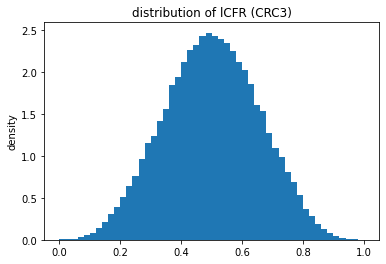

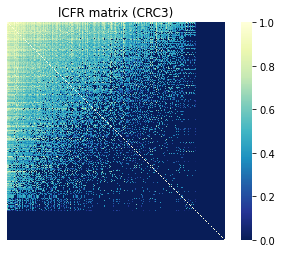

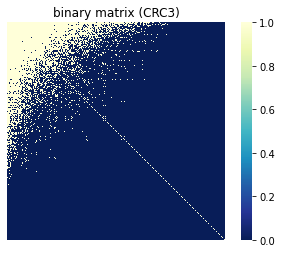

CRC3 NODF = 0.37627010528961424


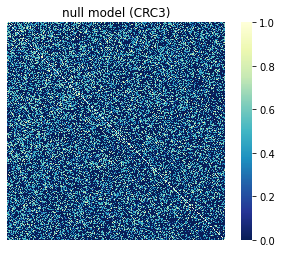

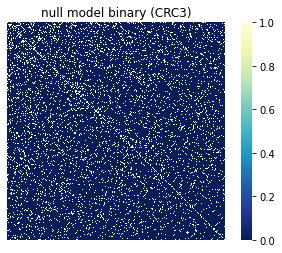

CRC3 last null model NODF = 0.11105844186374599
CRC3 p value = 4.759780002038988e-274


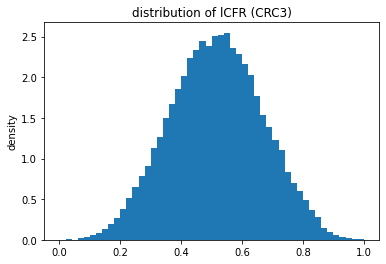

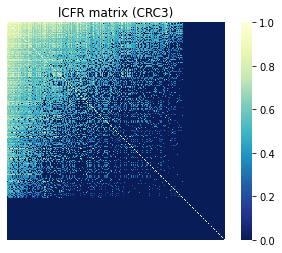

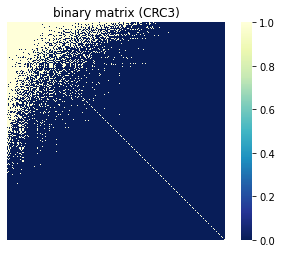

CRC3 NODF = 0.3548345234959814


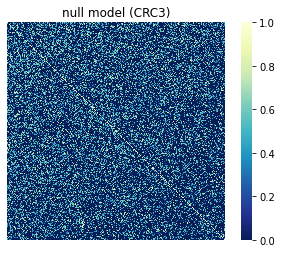

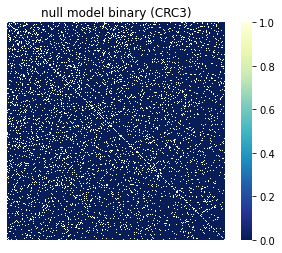

CRC3 last null model NODF = 0.10050174196058959
CRC3 p value = 1.2752011897712908e-278


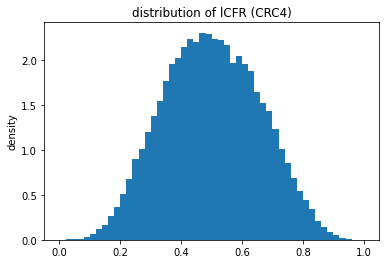

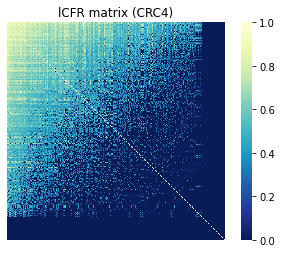

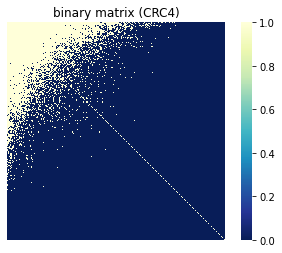

CRC4 NODF = 0.421583106986269


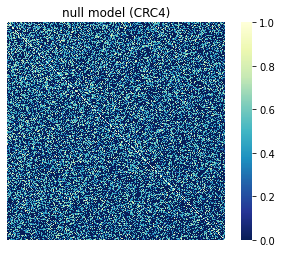

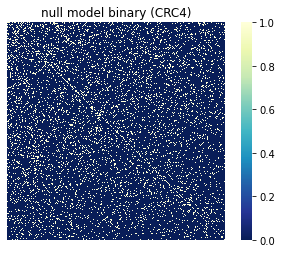

CRC4 last null model NODF = 0.12339071182580956
CRC4 p value = 7.684988307657019e-283


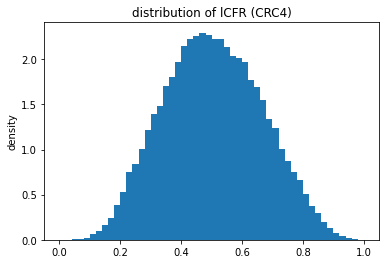

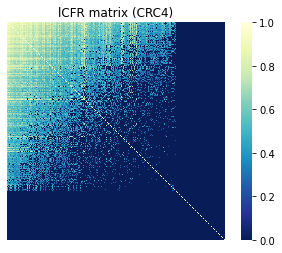

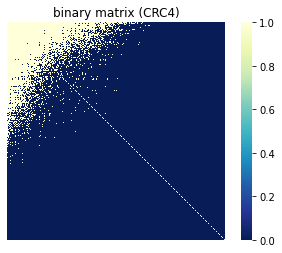

CRC4 NODF = 0.3095905069675584


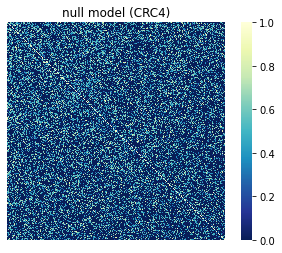

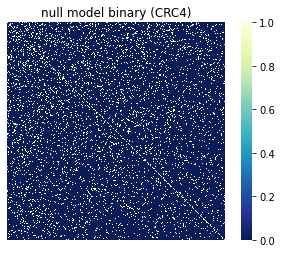

CRC4 last null model NODF = 0.10014015718998778
CRC4 p value = 8.99601897317336e-267


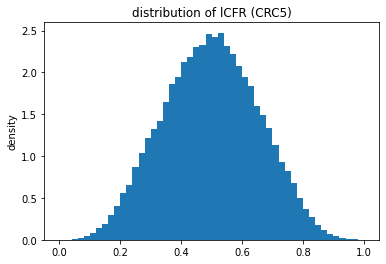

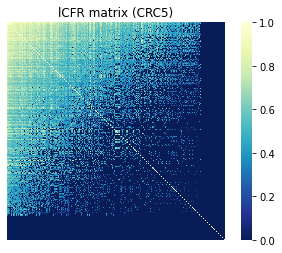

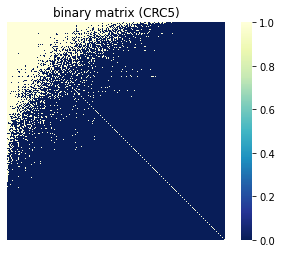

CRC5 NODF = 0.407950573482408


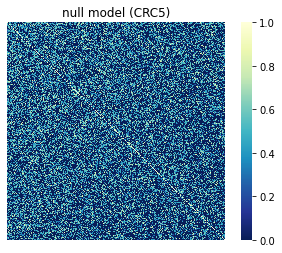

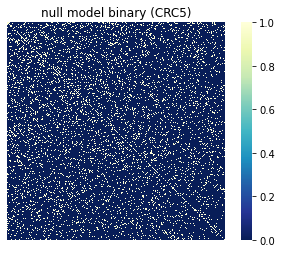

CRC5 last null model NODF = 0.11878141508769378
CRC5 p value = 1.1400776902891934e-278


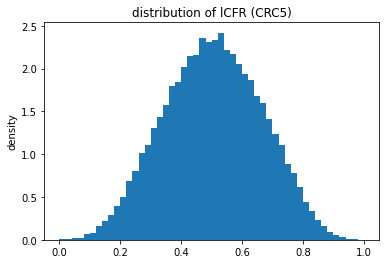

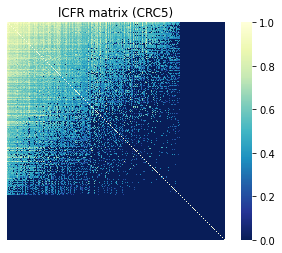

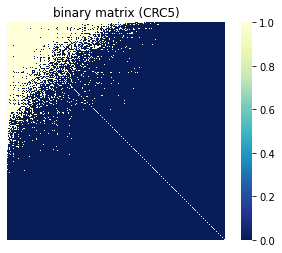

CRC5 NODF = 0.3493615636738465


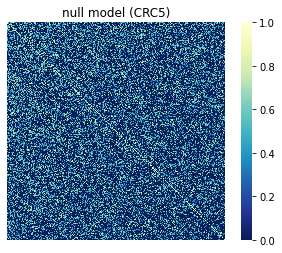

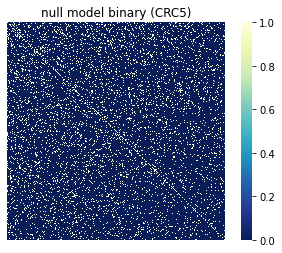

CRC5 last null model NODF = 0.11308617695800662
CRC5 p value = 1.3857040550217389e-271


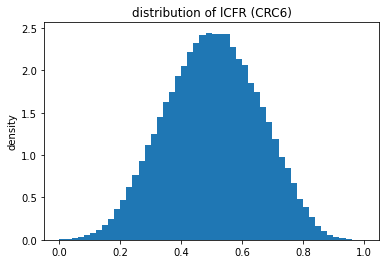

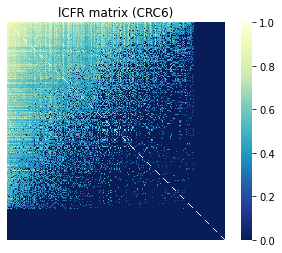

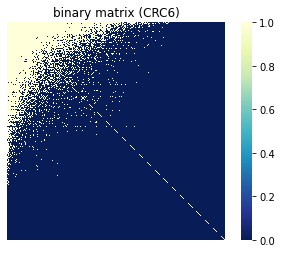

CRC6 NODF = 0.38307077331541817


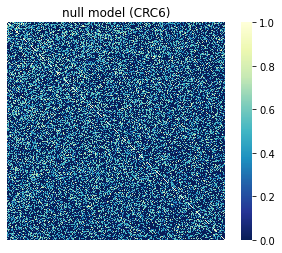

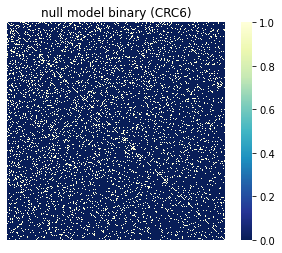

CRC6 last null model NODF = 0.11373145709076661
CRC6 p value = 4.324152525060672e-283


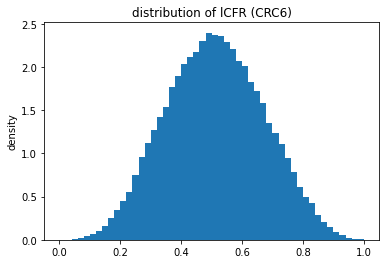

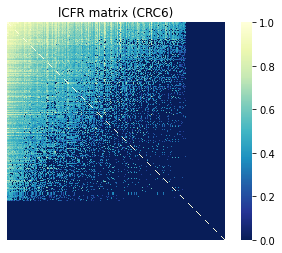

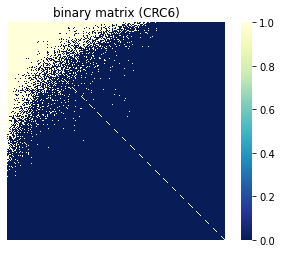

CRC6 NODF = 0.3978854575887161


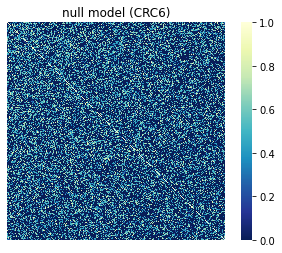

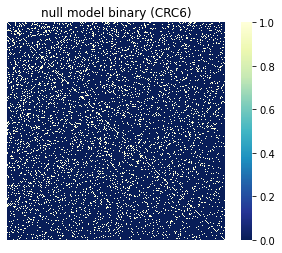

CRC6 last null model NODF = 0.1177044261075778
CRC6 p value = 1.6738580064478914e-283


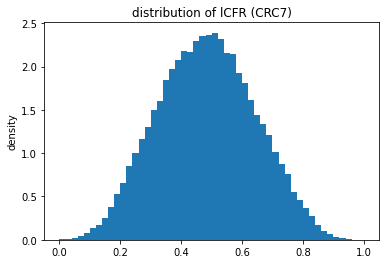

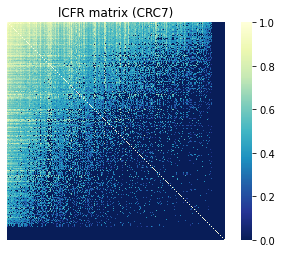

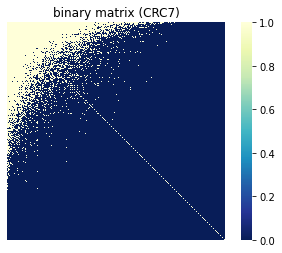

CRC7 NODF = 0.43172884100221154


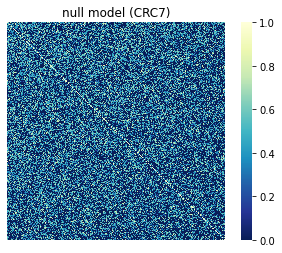

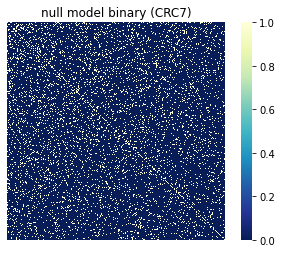

CRC7 last null model NODF = 0.11488979821580643
CRC7 p value = 2.936557321183942e-283


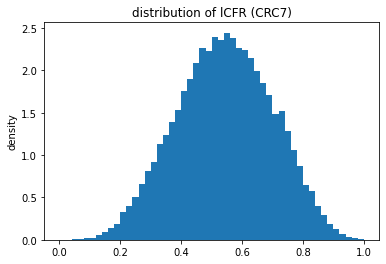

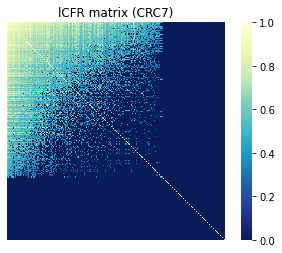

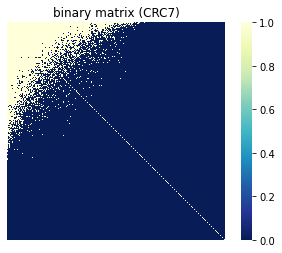

CRC7 NODF = 0.31479058526525727


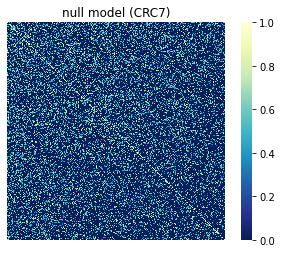

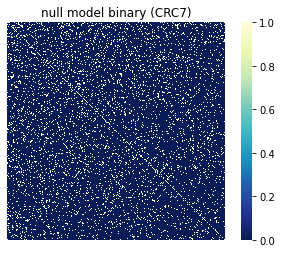

CRC7 last null model NODF = 0.10605438521084189
CRC7 p value = 1.8192987353210976e-262


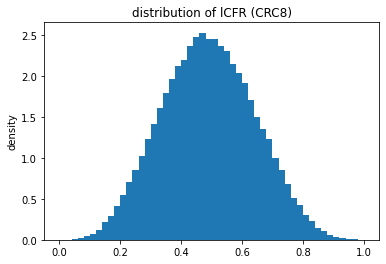

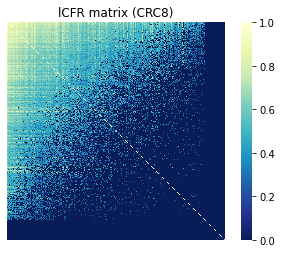

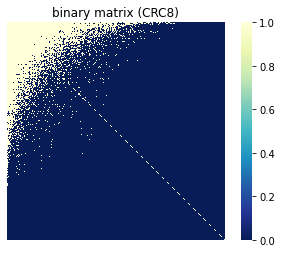

CRC8 NODF = 0.4123454731880865


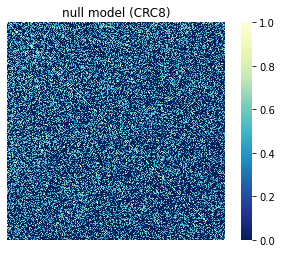

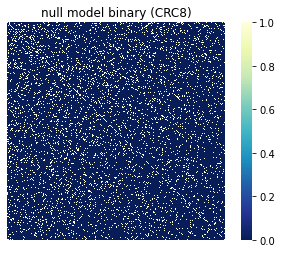

CRC8 last null model NODF = 0.1023431699303773
CRC8 p value = 4.35393545276479e-302


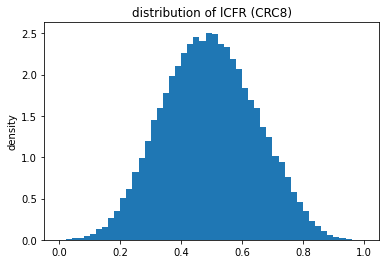

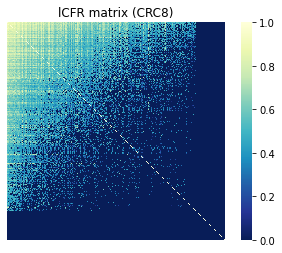

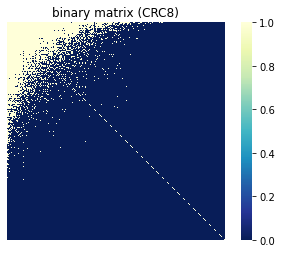

CRC8 NODF = 0.35615478354660524


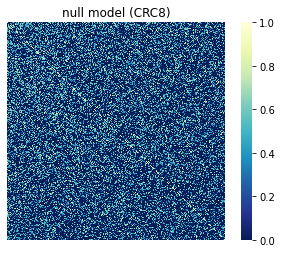

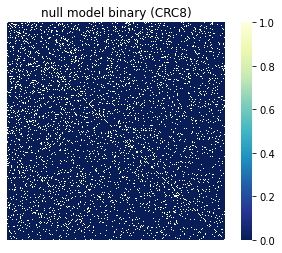

CRC8 last null model NODF = 0.09082340590752074
CRC8 p value = 2.3559058916849287e-296


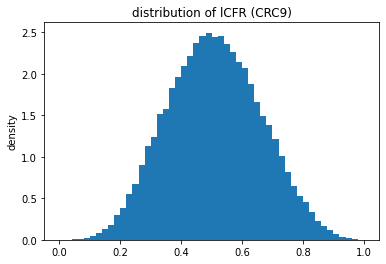

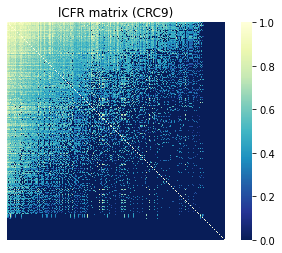

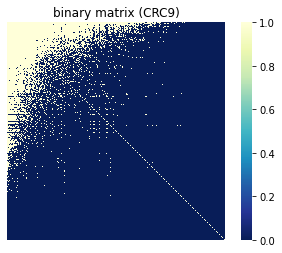

CRC9 NODF = 0.43378765753560833


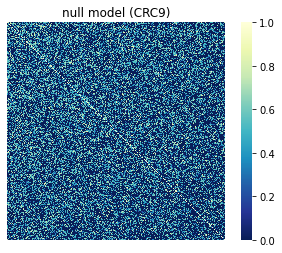

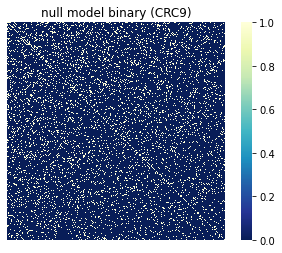

CRC9 last null model NODF = 0.11901239026972658
CRC9 p value = 1.1325293745301048e-288


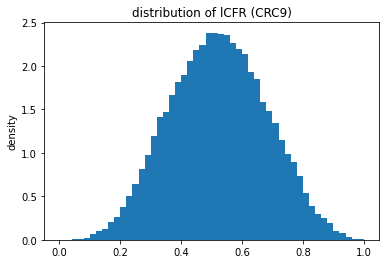

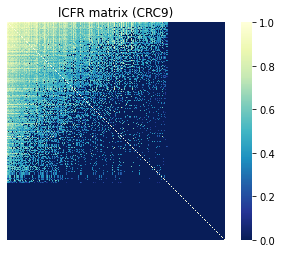

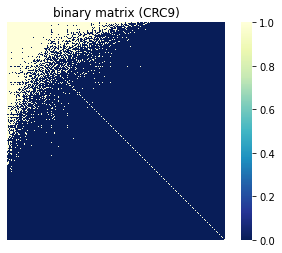

CRC9 NODF = 0.3383841239554988


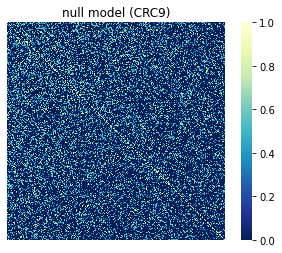

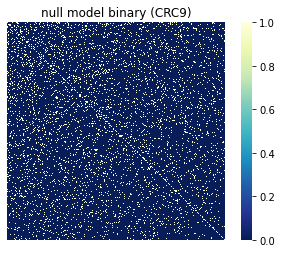

CRC9 last null model NODF = 0.09586065552650398
CRC9 p value = 3.2651774178352295e-275


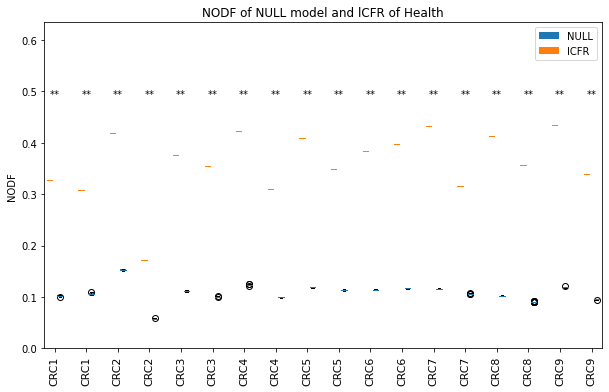

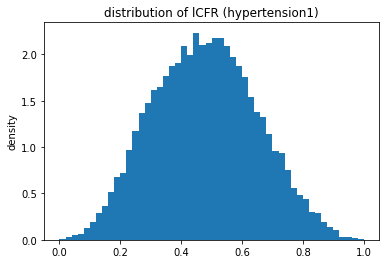

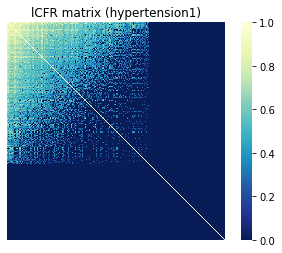

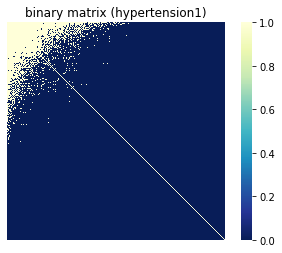

hypertension1 NODF = 0.21342693379694352


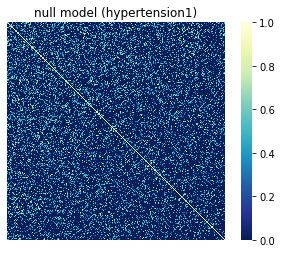

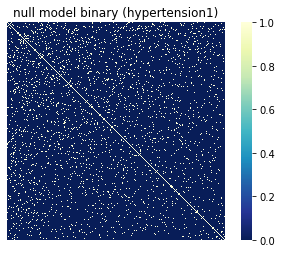

hypertension1 last null model NODF = 0.06305459008891297
hypertension1 p value = 1.7877124866390357e-251


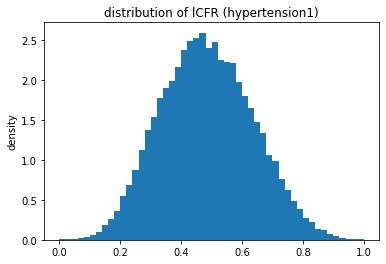

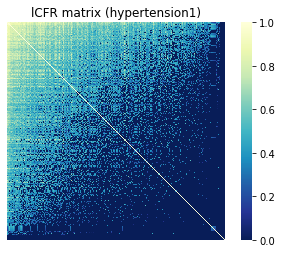

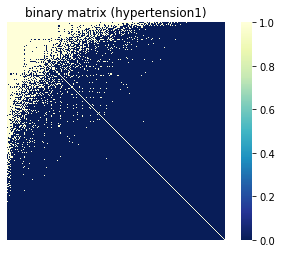

hypertension1 NODF = 0.45039785819308503


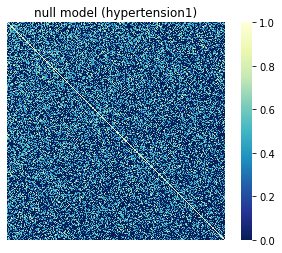

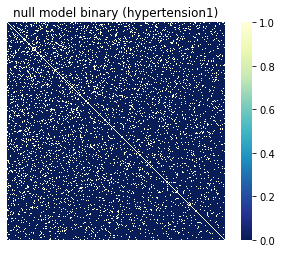

hypertension1 last null model NODF = 0.10708850319573467
hypertension1 p value = 8.759878905834492e-277


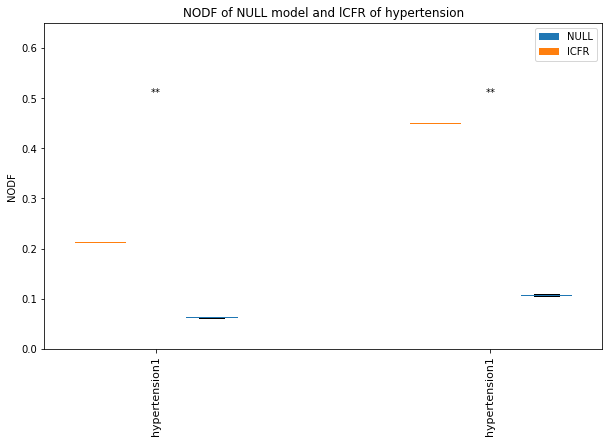

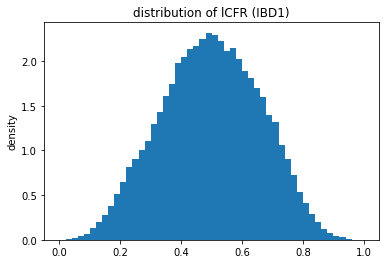

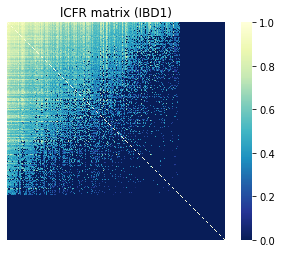

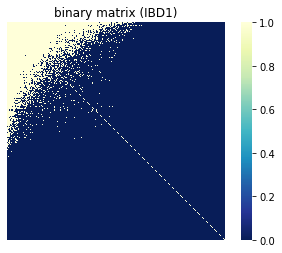

IBD1 NODF = 0.3018563984097464


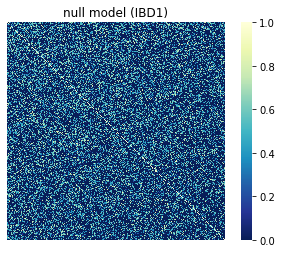

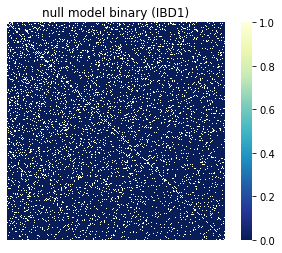

IBD1 last null model NODF = 0.10133642120997569
IBD1 p value = 1.4324087469400949e-270


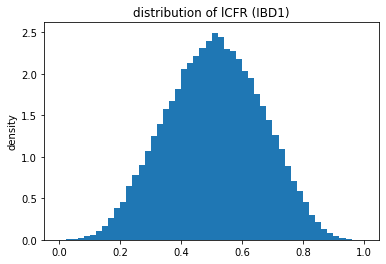

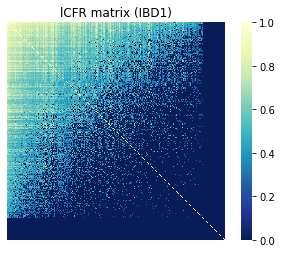

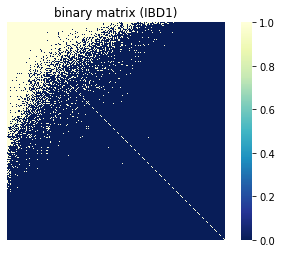

IBD1 NODF = 0.4376374787095882


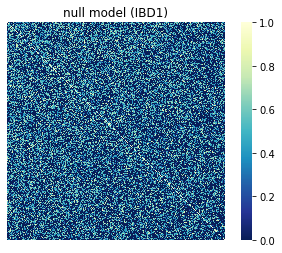

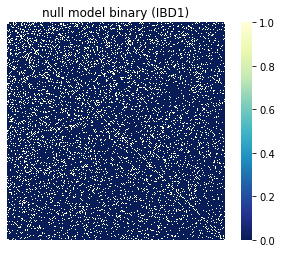

IBD1 last null model NODF = 0.12661598094800106
IBD1 p value = 1.2535282447591893e-291


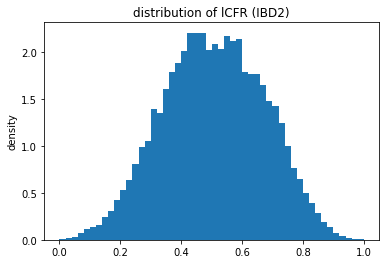

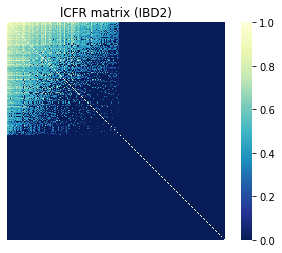

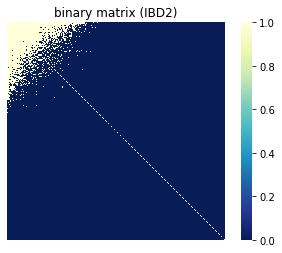

IBD2 NODF = 0.12922178516630803


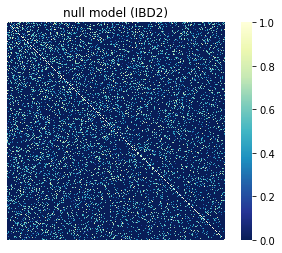

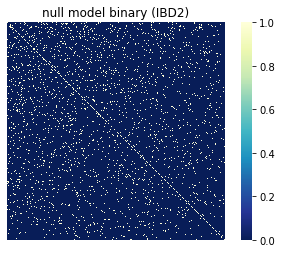

IBD2 last null model NODF = 0.05135414436028301
IBD2 p value = 1.2679826307109002e-231


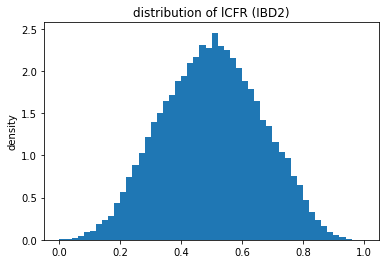

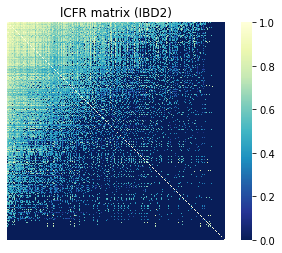

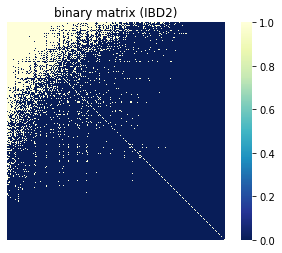

IBD2 NODF = 0.3686671523475477


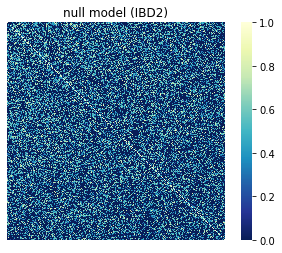

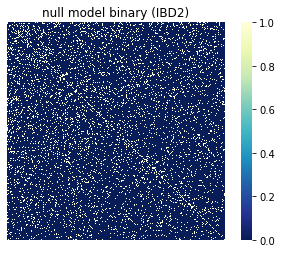

IBD2 last null model NODF = 0.11399278413886355
IBD2 p value = 1.6957102120708878e-271


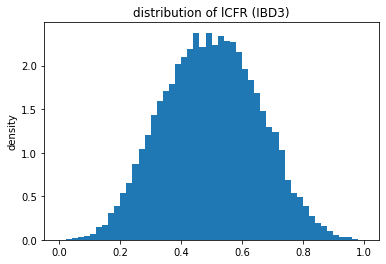

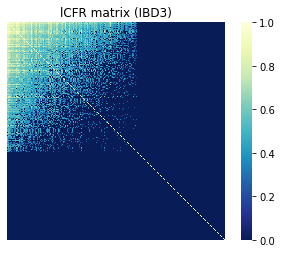

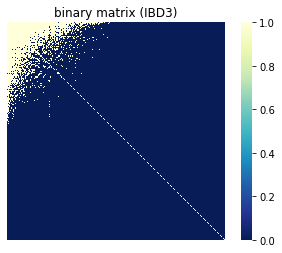

IBD3 NODF = 0.16455541280995892


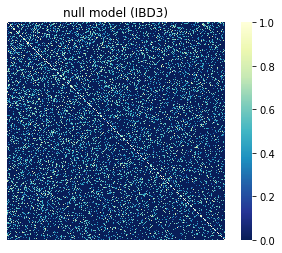

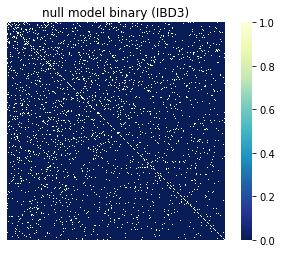

IBD3 last null model NODF = 0.05556254772211718
IBD3 p value = 9.638643515171495e-251


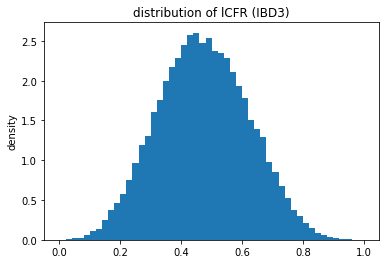

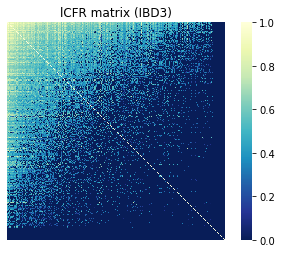

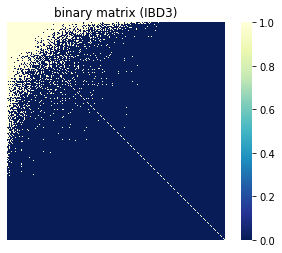

IBD3 NODF = 0.30017174697046206


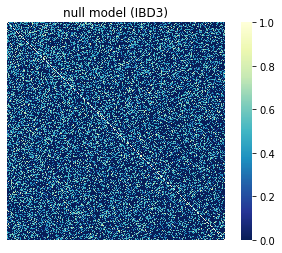

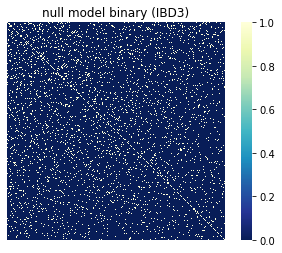

IBD3 last null model NODF = 0.07590277145326034
IBD3 p value = 1.3876277587217907e-269


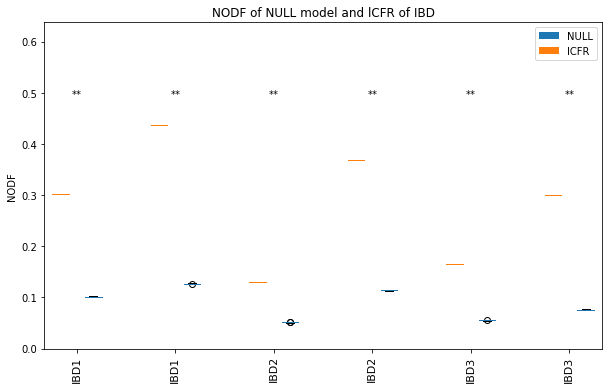

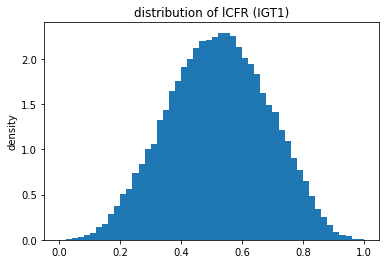

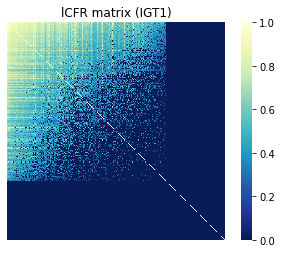

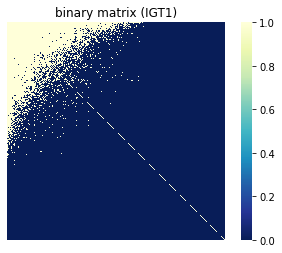

IGT1 NODF = 0.33973162448957117


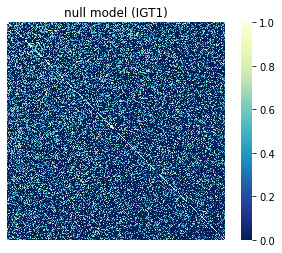

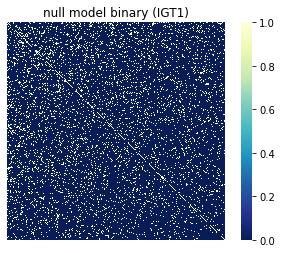

IGT1 last null model NODF = 0.11201183258263066
IGT1 p value = 6.639395575716972e-263


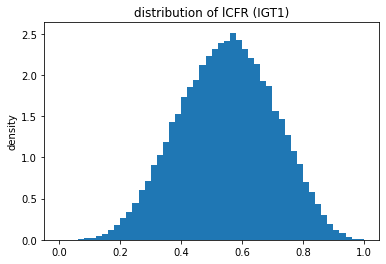

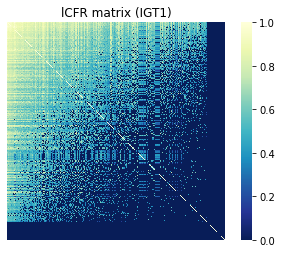

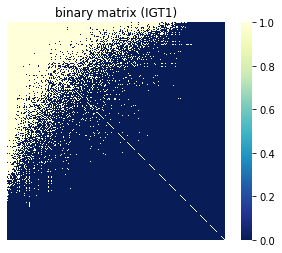

IGT1 NODF = 0.5684663702503745


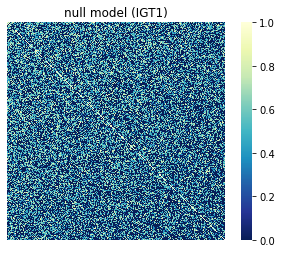

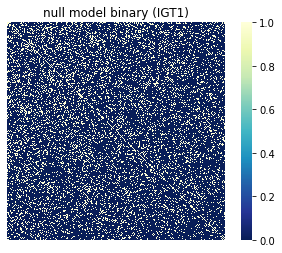

IGT1 last null model NODF = 0.1930215089816767
IGT1 p value = 1.399746605007301e-268


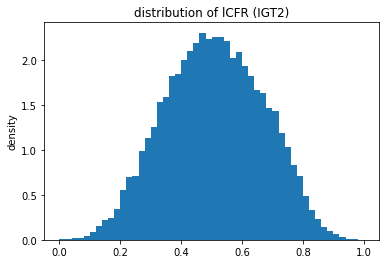

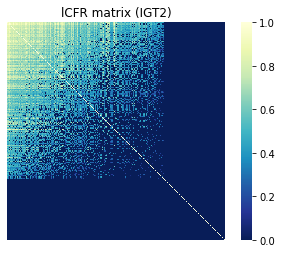

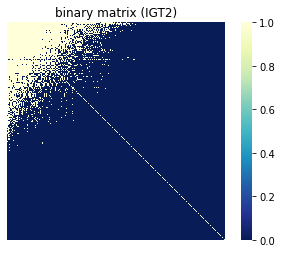

IGT2 NODF = 0.25389741167636865


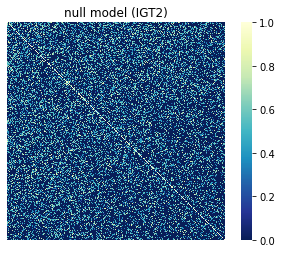

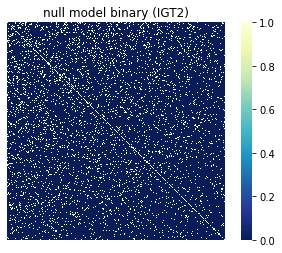

IGT2 last null model NODF = 0.09525056467180645
IGT2 p value = 2.331508914324262e-236


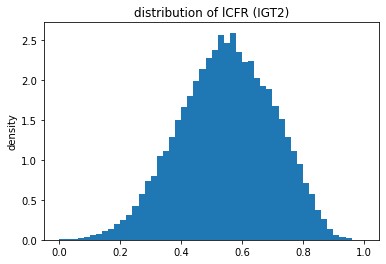

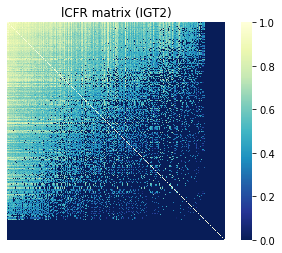

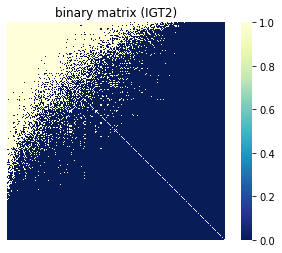

IGT2 NODF = 0.5271527821462991


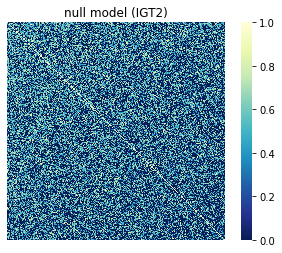

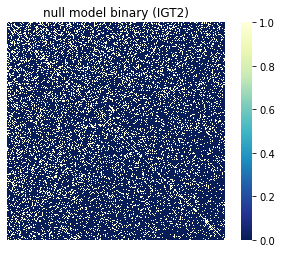

IGT2 last null model NODF = 0.1935585931037296
IGT2 p value = 2.018487946209598e-251


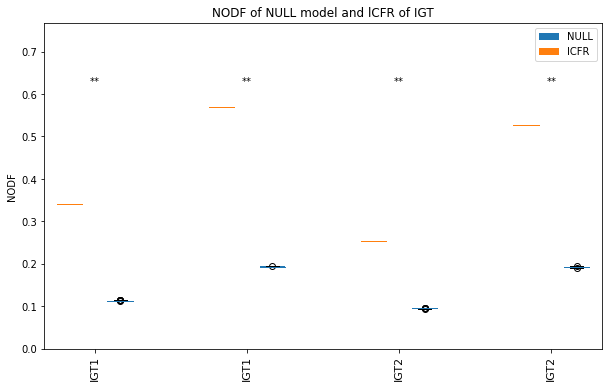

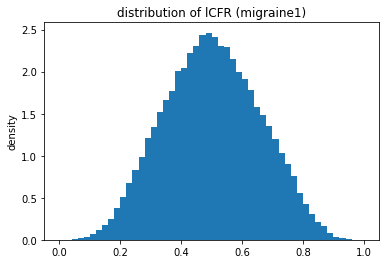

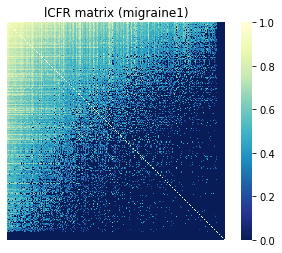

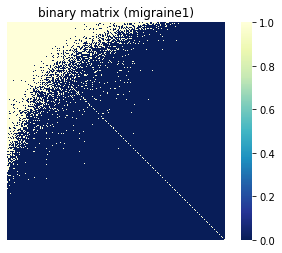

migraine1 NODF = 0.48420990190108504


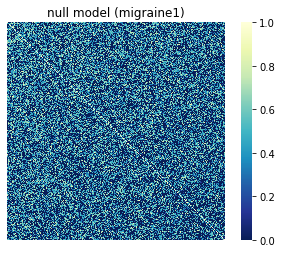

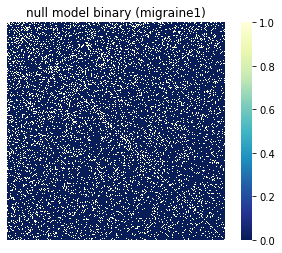

migraine1 last null model NODF = 0.13998142542343264
migraine1 p value = 9.288159273393128e-288


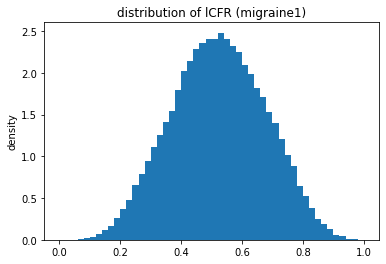

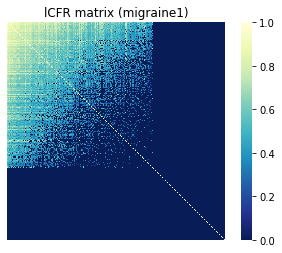

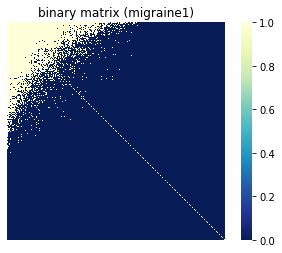

migraine1 NODF = 0.2799485081105268


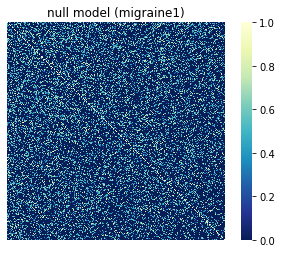

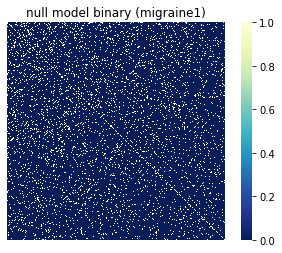

migraine1 last null model NODF = 0.08970324226574844
migraine1 p value = 6.426421347222426e-267


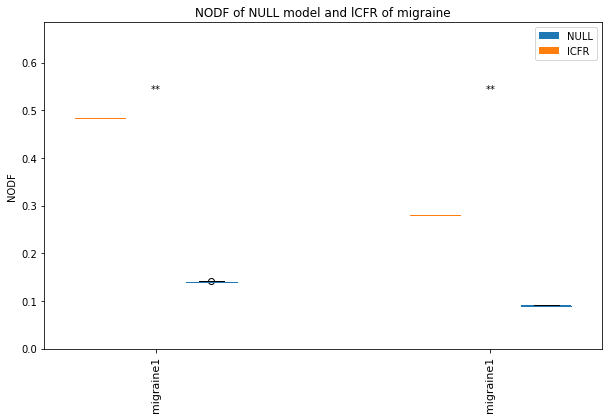

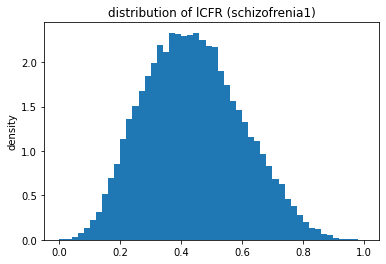

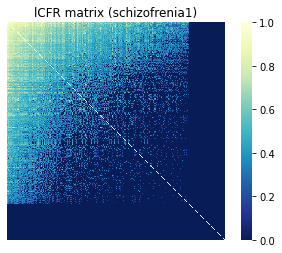

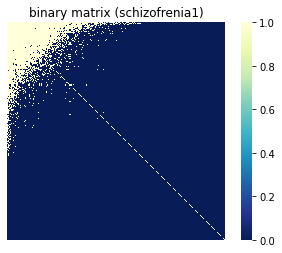

schizofrenia1 NODF = 0.2623573607744977


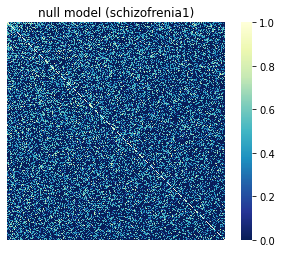

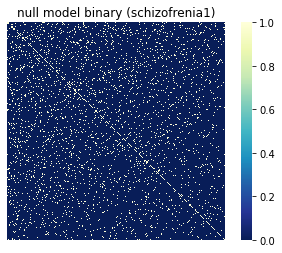

schizofrenia1 last null model NODF = 0.06637813513245301
schizofrenia1 p value = 3.403553309330275e-265


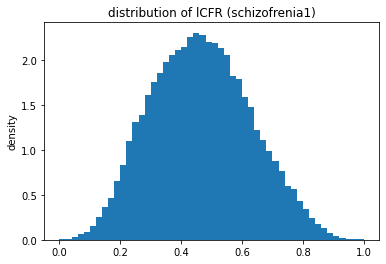

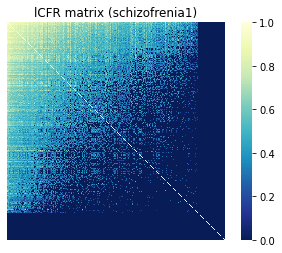

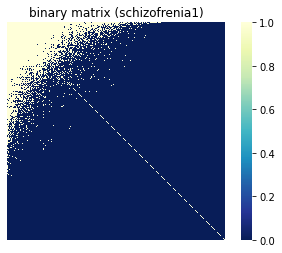

schizofrenia1 NODF = 0.3546933285177764


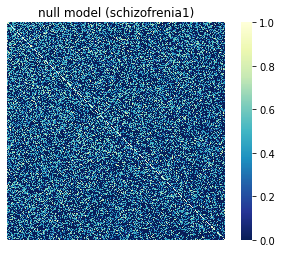

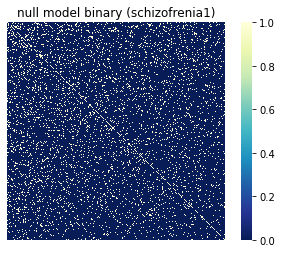

schizofrenia1 last null model NODF = 0.09981746961083729
schizofrenia1 p value = 1.6362916754729968e-268


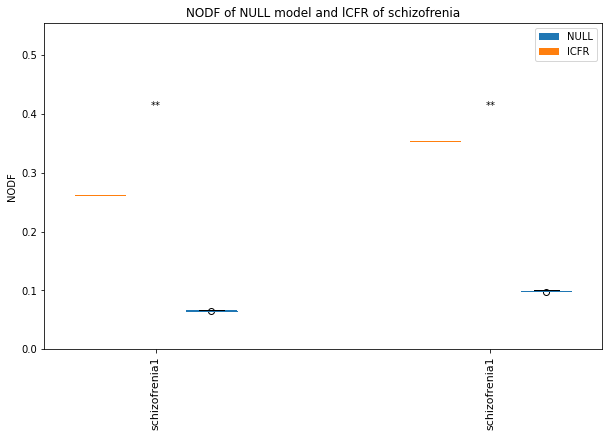

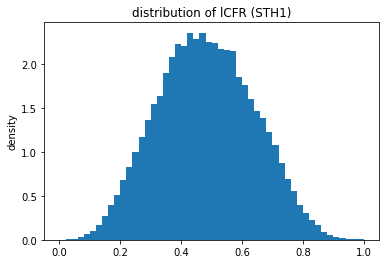

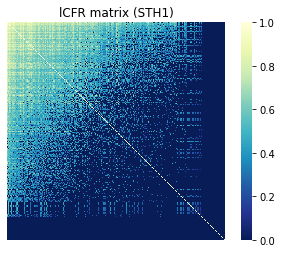

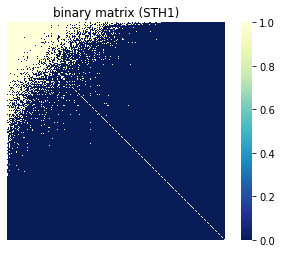

STH1 NODF = 0.32002963637547255


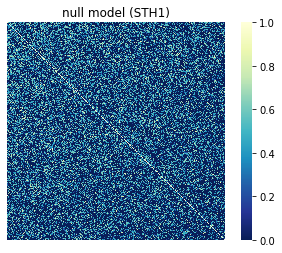

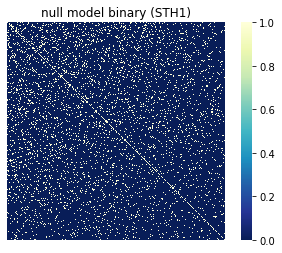

STH1 last null model NODF = 0.09446228088669309
STH1 p value = 4.2683200617864417e-259


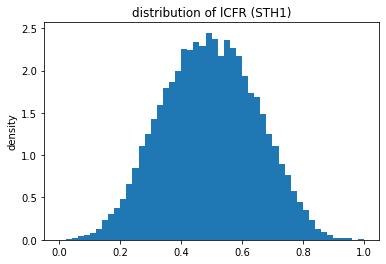

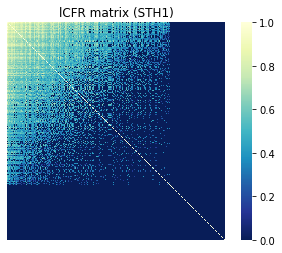

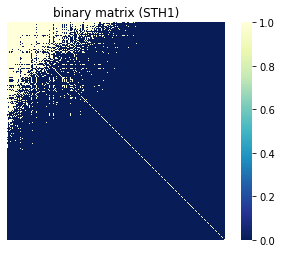

STH1 NODF = 0.23095571106948476


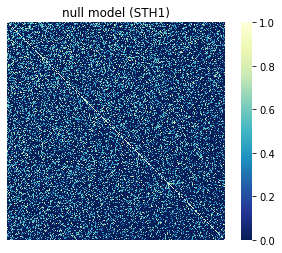

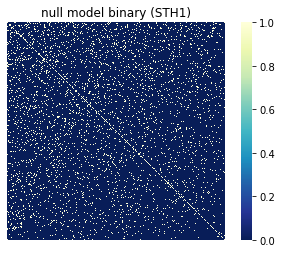

STH1 last null model NODF = 0.07862469951726958
STH1 p value = 2.545165598762391e-243


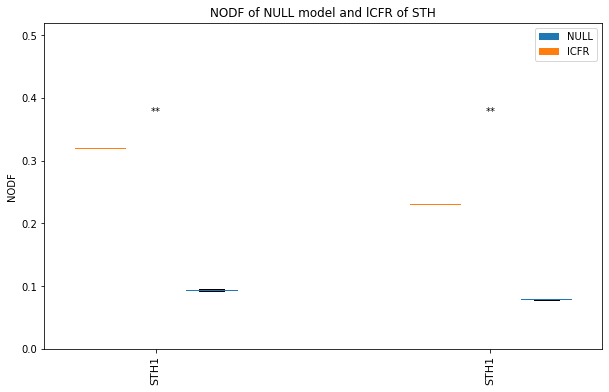

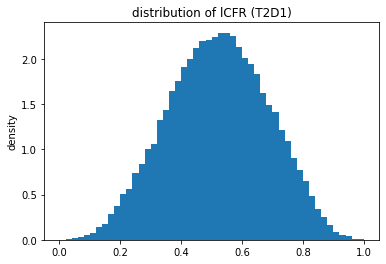

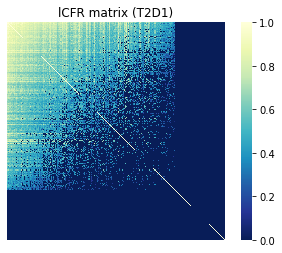

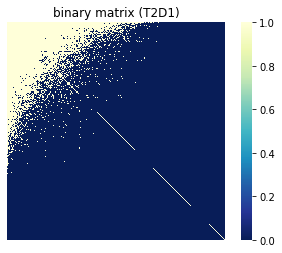

T2D1 NODF = 0.38033517212052137


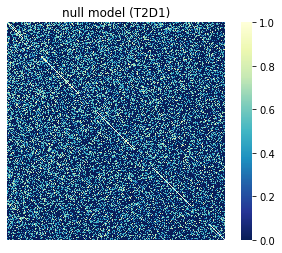

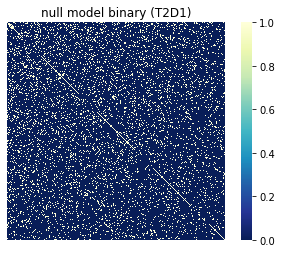

T2D1 last null model NODF = 0.12491791221037848
T2D1 p value = 1.121306947636564e-262


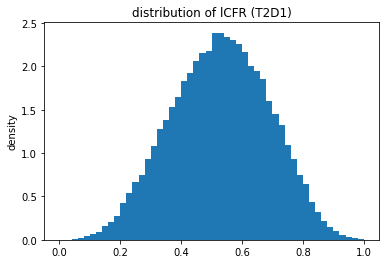

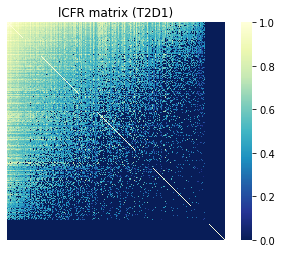

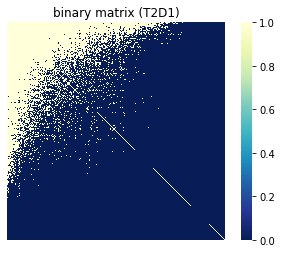

T2D1 NODF = 0.513650962943826


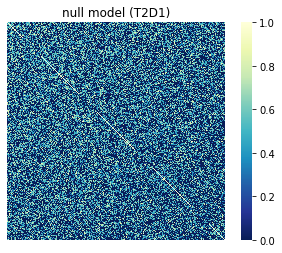

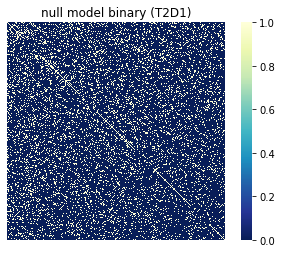

T2D1 last null model NODF = 0.16608717371462467
T2D1 p value = 1.1825172036593594e-271


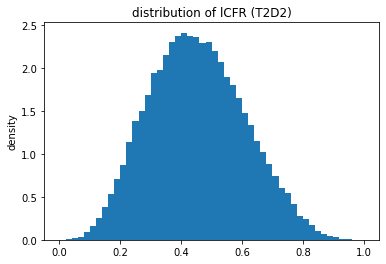

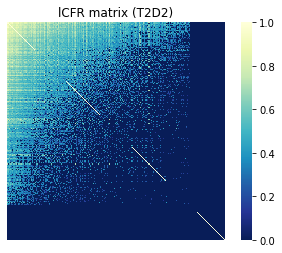

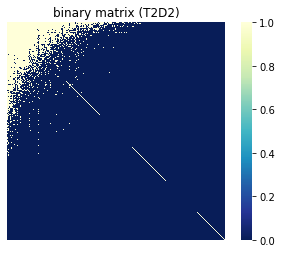

T2D2 NODF = 0.2484735169922189


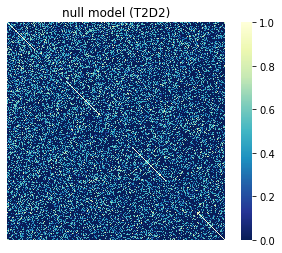

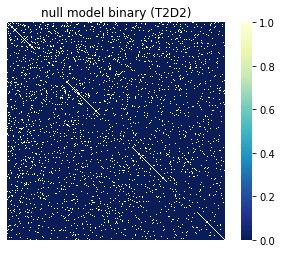

T2D2 last null model NODF = 0.06261410891030623
T2D2 p value = 2.2817136806943146e-274


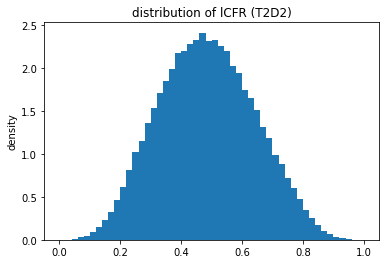

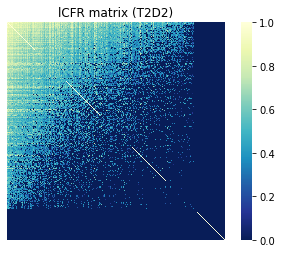

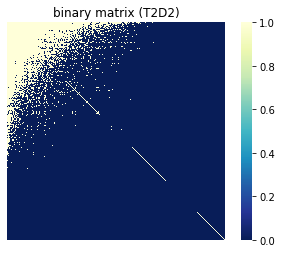

T2D2 NODF = 0.32984074083230946


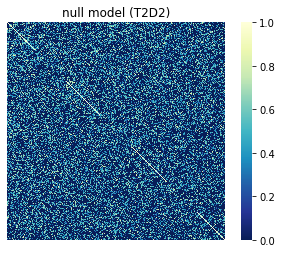

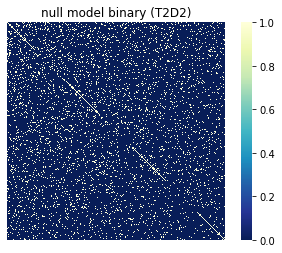

T2D2 last null model NODF = 0.09044817939566768
T2D2 p value = 2.2612136714851673e-286


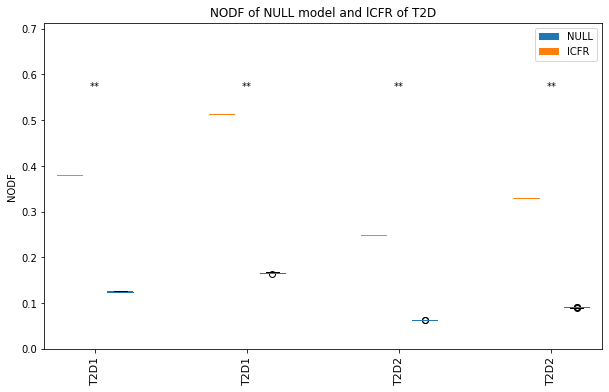

In [3]:

for disease in fr_dict.keys():
    empty_all = []
    nestedness_all = []
    p_list = []
    labels = []
    for cohort in fr_dict[disease].keys():
        for pheno in fr_dict[disease][cohort].keys():
            current_label = '{}'.format(cohort)
            scores, nested_nodf_score, p = nestedness(fr_dict[disease][cohort][pheno], current_label)
            empty_all.append(scores)
            nestedness_all.append(nested_nodf_score)
            p_list.append(p)
            labels.append(current_label)
    nested = [[x] for x in nestedness_all]
    x1 = list(range(1, len(p_list)*3, 3))
    x2 = [x+1 for x in x1]
    max_y = max(nestedness_all)
    plt.figure(figsize=(10, 6))
    box1 = plt.boxplot(empty_all,positions=x2, patch_artist=True, 
                boxprops={"facecolor": "C0",
                        "edgecolor": "C0",
                        "linewidth": 0},
                medianprops={"color": "C0", "linewidth": 1})
    box2 = plt.boxplot(nested,positions=x1, patch_artist=True, 
                boxprops={"facecolor": "C1",
                        "edgecolor": "C1",
                        "linewidth": 0},
                medianprops={"color": "C1", "linewidth": 1})
    lx = [(x1[i] + x2[i])/2 for i in range(len(x1))]
    plt.ylim([0, max(nestedness_all)+ 0.2])
    plt.xticks(lx,labels,fontsize=11, rotation=90)
    plt.ylabel('NODF')

    # add p value
    for i, x in enumerate(lx):
        p = p_list[i]
        if p < 0.01:
            mark = '**'
        elif p < 0.05:
            mark = '*'
        else:
            mark = ''
        plt.text(x, max_y + 0.05, mark, ha='center', va='bottom', fontsize=10)

    plt.legend(handles=[box1['boxes'][0],box2['boxes'][0]],labels=['NULL','lCFR'], loc=1)
    plt.title('NODF of NULL model and lCFR of {}'.format(pheno))
    plt.show()
    